# Exercícios - Aula 4

## Importando as bibliotecas que vão ser usadas

In [18]:
import random
random.seed(42)

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import CategoricalNB
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

plt.style.use("ggplot")

## Exercícios

### 1 - Repita todos os passos acima para a base de dados BreastCancer.

In [16]:
# Lê os dados de um arquivo .csv

data = pd.read_csv('data/BreastCancer.csv', header = (0))
data = data.drop(data.columns[0], axis = 1) # Drop the ID column
data = data.dropna(axis = 'rows') # Remove linhas que contenham NaN (not a number)

data.head(10)

,Cl.thickness,Cell.size,Cell.shape,Marg.adhesion,Epith.c.size,Bare.nuclei,Bl.cromatin,Normal.nucleoli,Mitoses,Class
0,5,1,1,1,2,1.0,3,1,1,0
1,5,4,4,5,7,10.0,3,2,1,0
2,3,1,1,1,2,2.0,3,1,1,0
3,6,8,8,1,3,4.0,3,7,1,0
4,4,1,1,3,2,1.0,3,1,1,0
5,8,10,10,8,7,10.0,9,7,1,1
6,1,1,1,1,2,10.0,3,1,1,0
7,2,1,2,1,2,1.0,3,1,1,0
8,2,1,1,1,2,1.0,1,1,5,0
9,4,2,1,1,2,1.0,2,1,1,0


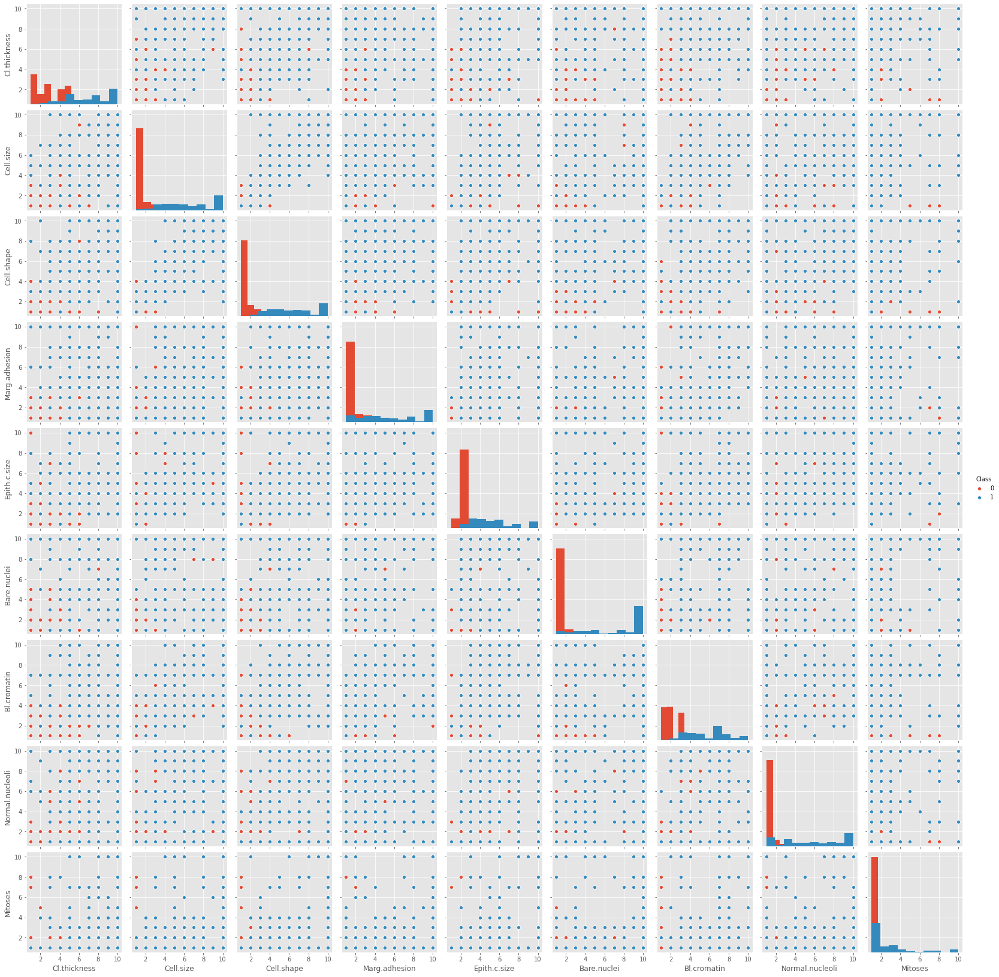

In [17]:
sns.pairplot(data, hue = "Class", diag_kind = "hist")
plt.show()

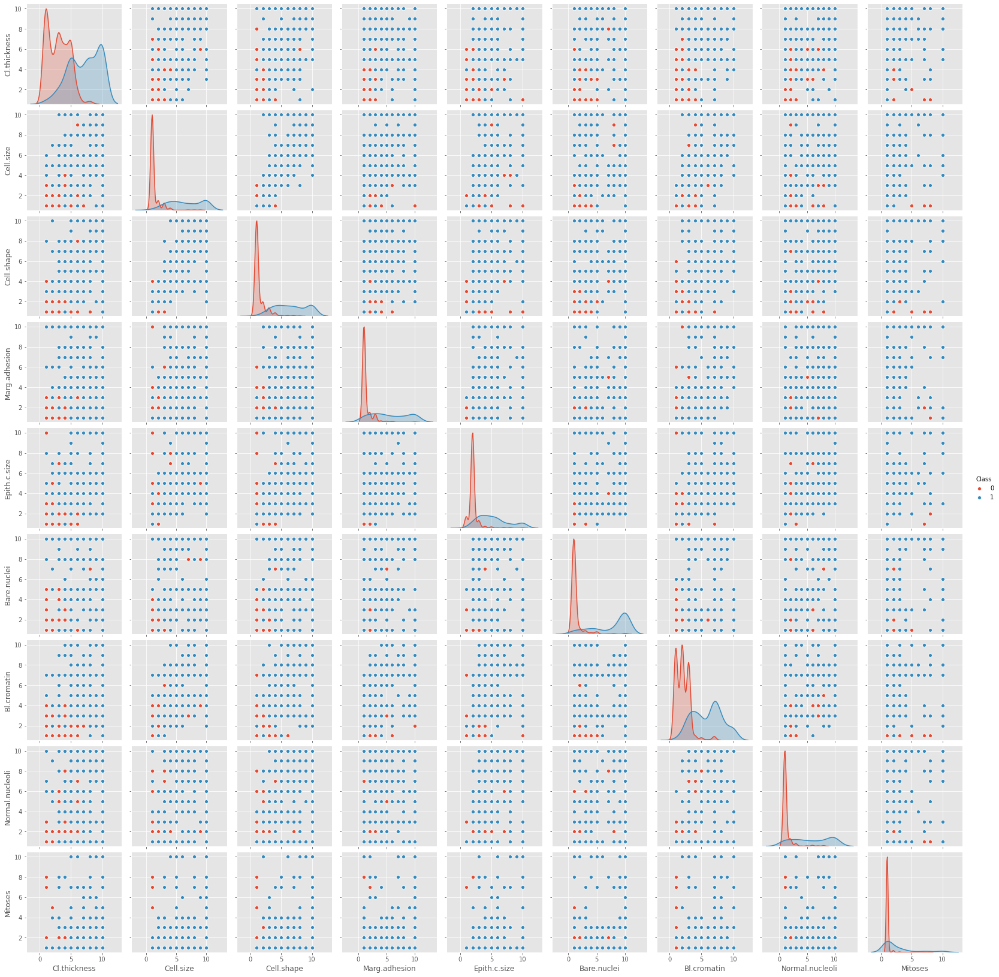

In [24]:
sns.pairplot(data, hue = "Class")
plt.show()

In [3]:
# Vamos armazenar os nomes das classes possíveis do dataset em uma numpy array
classes = np.array(pd.unique(data[data.columns[-1]]), dtype = int)

classes

array([0, 1])

In [4]:
print("O dataset contém {} atributos e {} observações.".format(data.shape[1], data.shape[0]))
print("Atributos do dataset:")

list(data.columns)

O dataset contém 10 atributos e 683 observações.
Atributos do dataset:


['Cl.thickness',
 'Cell.size',
 'Cell.shape',
 'Marg.adhesion',
 'Epith.c.size',
 'Bare.nuclei',
 'Bl.cromatin',
 'Normal.nucleoli',
 'Mitoses',
 'Class']

In [5]:
# Converte os dados em uma array do numpy
data_np = data.to_numpy()

data_np

array([[ 5.,  1.,  1., ...,  1.,  1.,  0.],
       [ 5.,  4.,  4., ...,  2.,  1.,  0.],
       [ 3.,  1.,  1., ...,  1.,  1.,  0.],
       ...,
       [ 5., 10., 10., ..., 10.,  2.,  1.],
       [ 4.,  8.,  6., ...,  6.,  1.,  1.],
       [ 4.,  8.,  8., ...,  4.,  1.,  1.]])

In [6]:
# Vamos guardar as nossas clsses em y (que vamos tentar predizer)
y = data_np[:,-1]
# E as amostras com seus atributos em X
X = data_np[:,0:data.shape[1]-1]

print(y[0], X[0])

data.head(1)

0.0 [5. 1. 1. 1. 2. 1. 3. 1. 1.]


,Cl.thickness,Cell.size,Cell.shape,Marg.adhesion,Epith.c.size,Bare.nuclei,Bl.cromatin,Normal.nucleoli,Mitoses,Class
0,5,1,1,1,2,1.0,3,1,1,0


In [11]:
# Para treinar o classificador vamos separar o dataset em training set e test set (70% train set e 30% test set)

x_train, x_test, y_train, y_test = train_test_split(X, y, train_size = 0.3, random_state = 42)

x_train.shape, x_test.shape

((204, 9), (479, 9))

Vamos afirmar que as variáveis seguem uma distribuição categória (que elas sejam discretas), dado que cada atributo segue um intervalo bem definido.

In [22]:
model = CategoricalNB()
model.fit(x_train, y_train)

y_pred = model.predict(x_test)

score = accuracy_score(y_pred, y_test)
print('Accuracy:', score)

Accuracy: 0.9728601252609603


Para afim de comparações vamos tentar com uma distribuição normal (mesmo tendo assumido que os atributos são categóricos).

In [23]:
model = GaussianNB()
model.fit(x_train, y_train)

y_pred = model.predict(x_test)

score = accuracy_score(y_pred, y_test)
print('Accuracy:', score)

Accuracy: 0.9561586638830898
